In [64]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [81]:
data = pd.read_csv("cap_data_final3.csv")

In [66]:
data3 = data.loc[(data['party'] =='D'),:]

In [70]:
data4 = data.loc[(data['party'] =='R'),:]

In [82]:
data = data.loc[(data['year'] == 2014),:]

In [92]:
Parties2014 = data.loc[(data['year'] == 2014),:]

In [99]:
Dem2014 = data.loc[((data['party'] =='D') & (data['year'] == 2014)),:]

C:\Users\devin\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


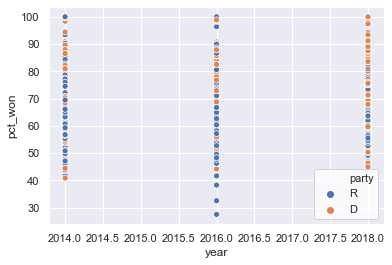

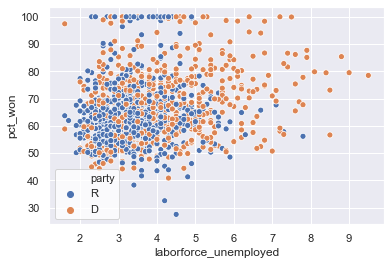

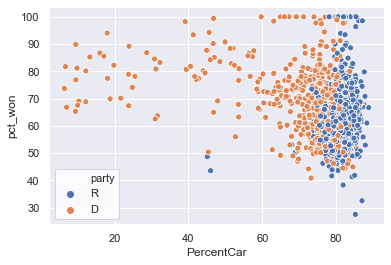

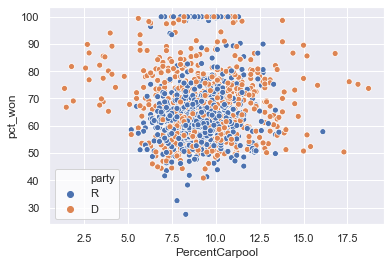

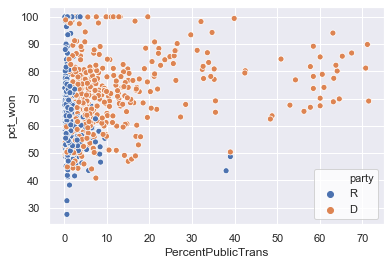

...

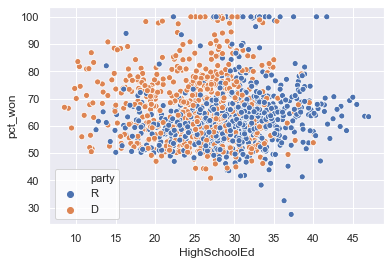

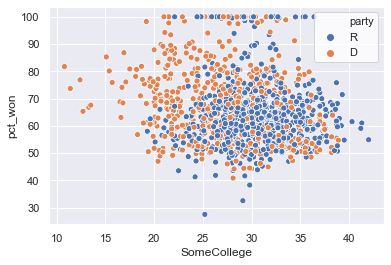

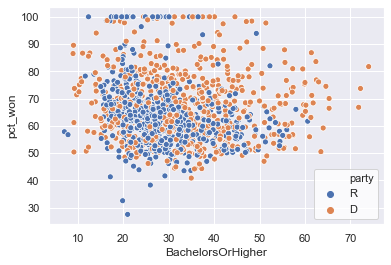

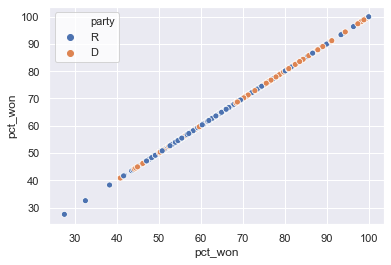

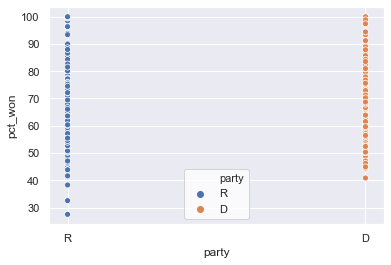

In [30]:
for column in data.columns[4:]: 
    sns.set()
    fig, ax = plt.subplots()
    sns.set(style="ticks")
    sns.scatterplot(x= column, y='pct_won', data=data, hue='party')  


C:\Users\devin\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


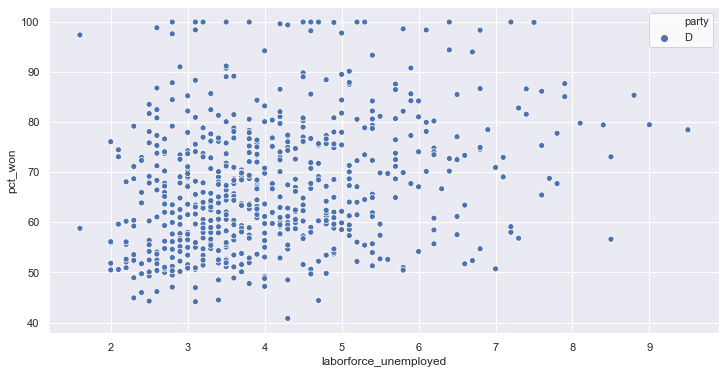

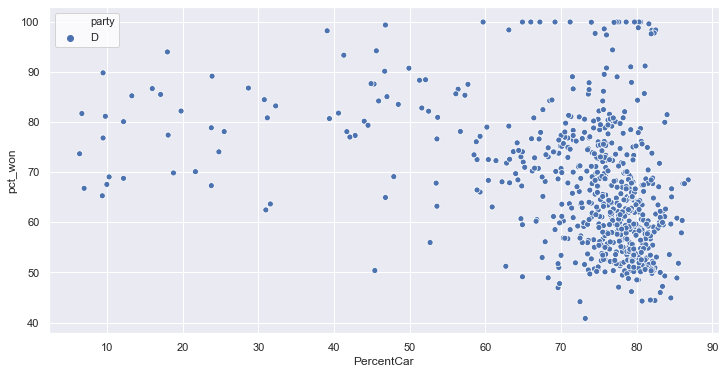

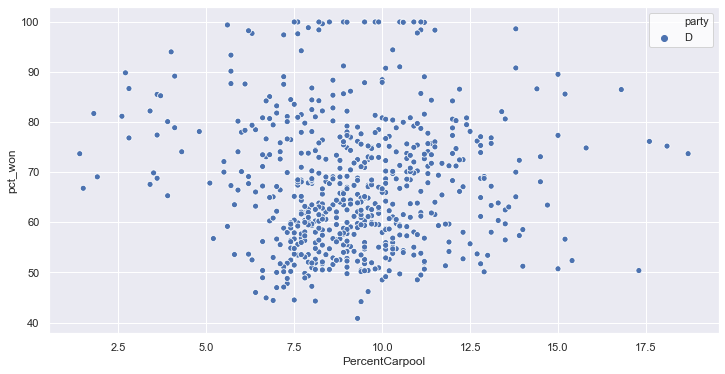

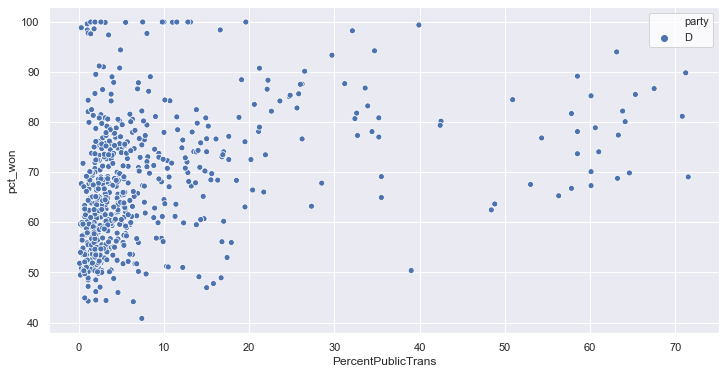

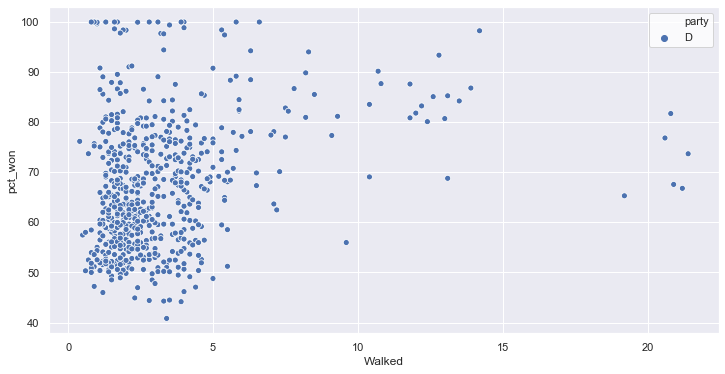

...

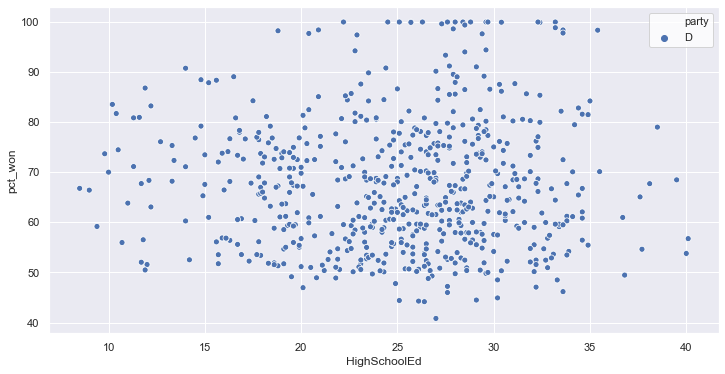

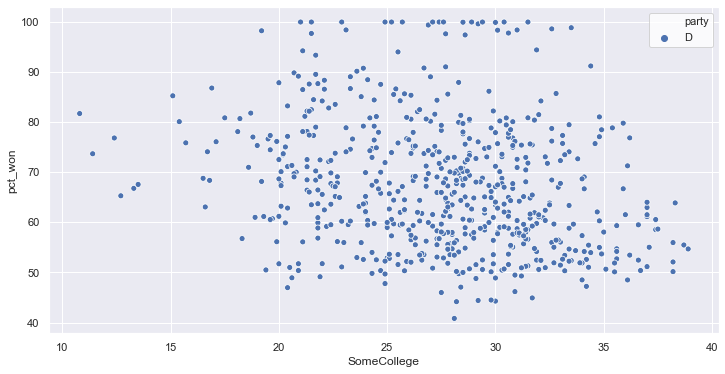

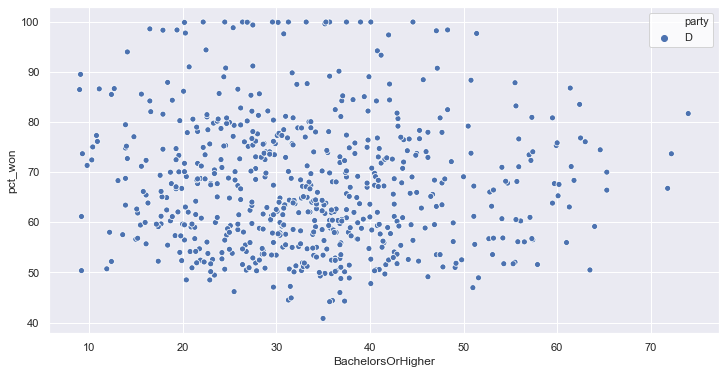

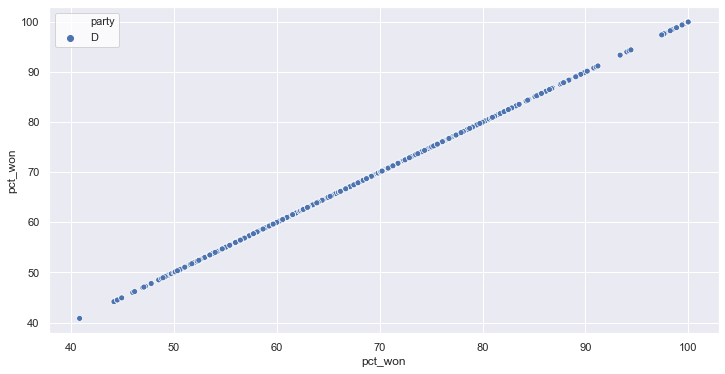

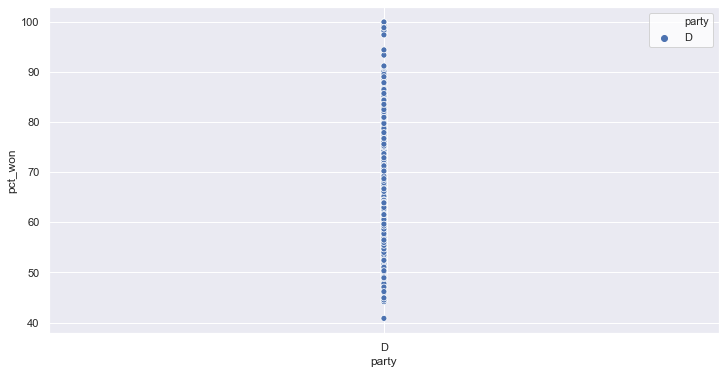

In [69]:
#Democrats
for column in data3.columns[5:]: 
    sns.set()
    fig, ax = plt.subplots()
    sns.set(style="ticks")
    sns.scatterplot(x= column, y='pct_won', data=data3, hue='party')  

C:\Users\devin\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


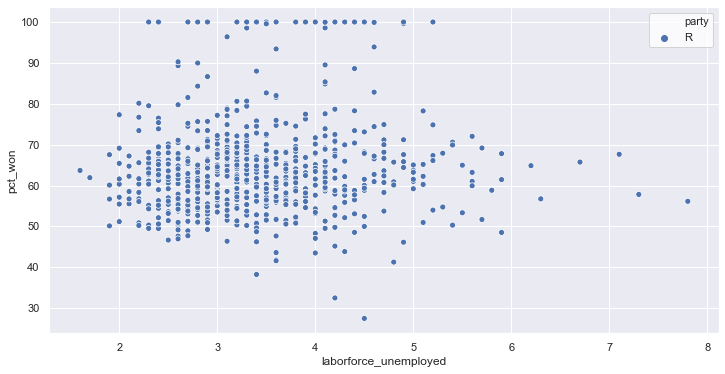

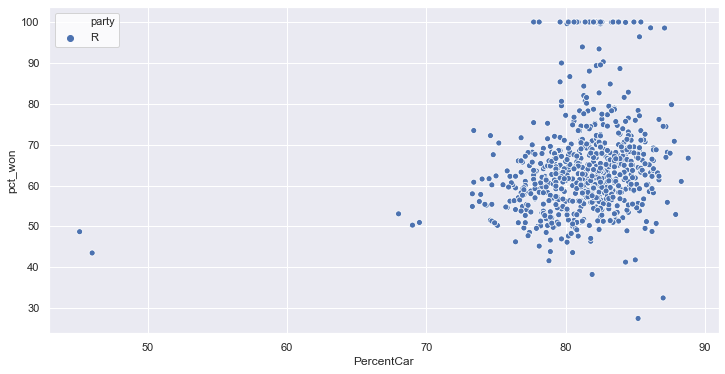

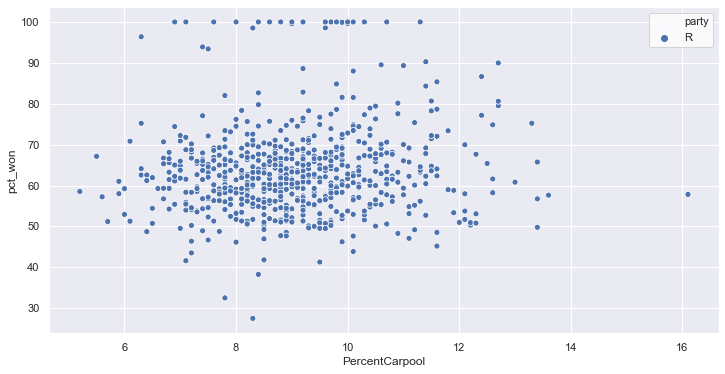

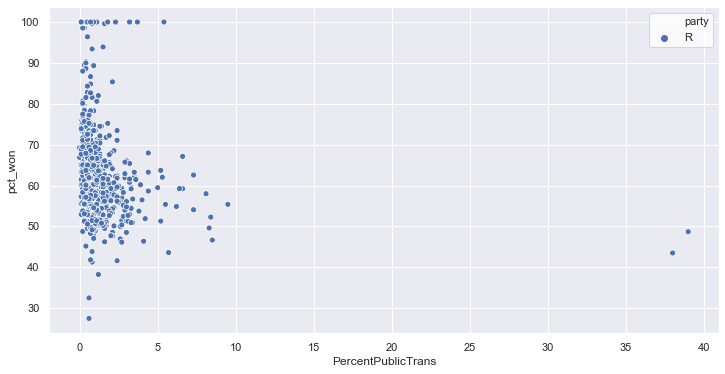

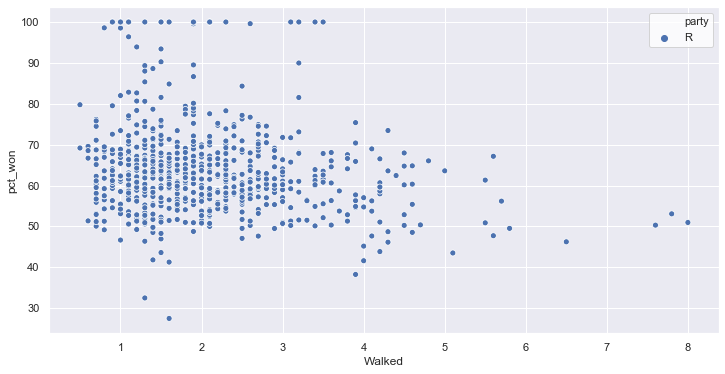

...

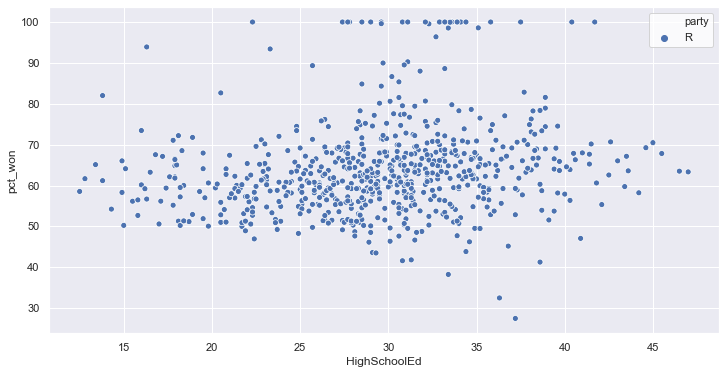

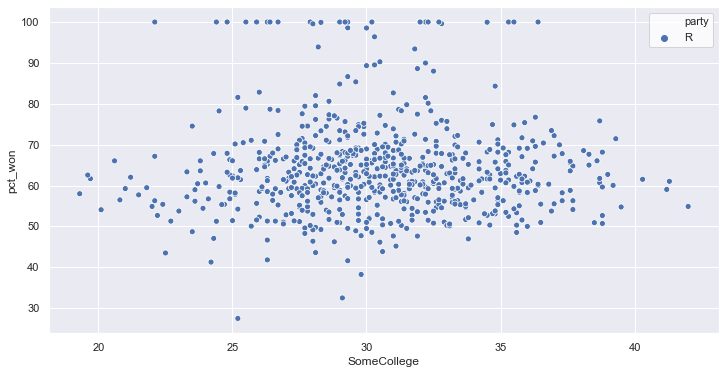

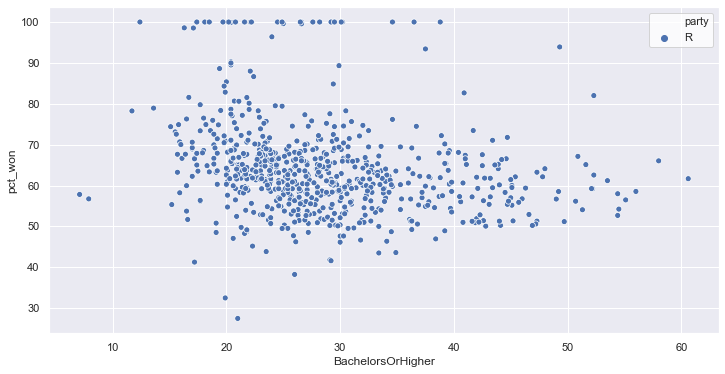

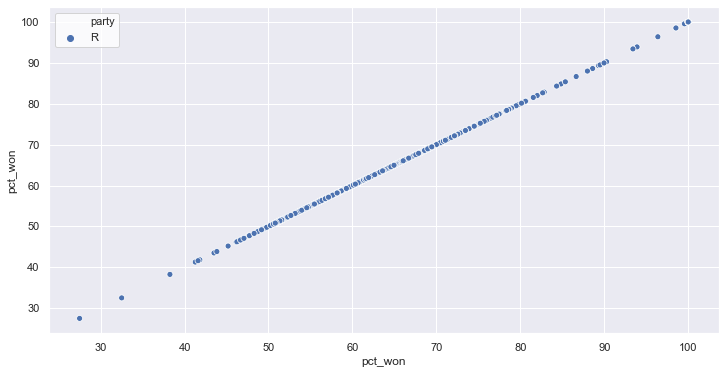

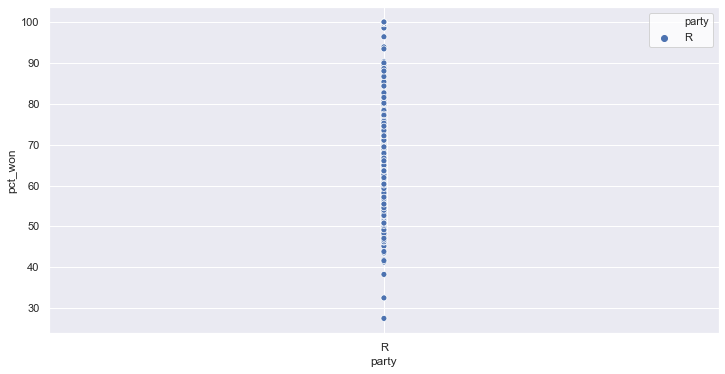

In [71]:
#Republicans
for column in data4.columns[5:]: 
    sns.set()
    fig, ax = plt.subplots()
    sns.set(style="ticks")
    sns.scatterplot(x= column, y='pct_won', data=data4, hue='party')  

## Both Parties Correlation

### All Years

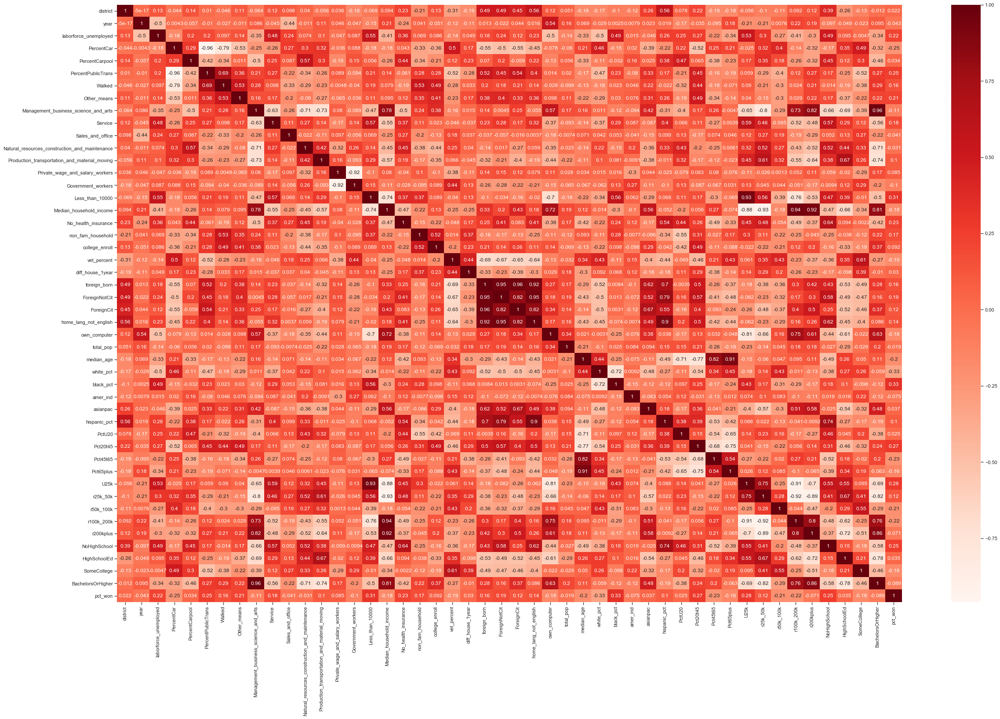

In [72]:
plt.figure(figsize=(40,25))
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [73]:
cor_target = abs(cor["pct_won"])
relevant_features = cor_target[cor_target>0.1].sort_values(ascending=False)
relevant_features

pct_won                                          1.000000
white_pct                                        0.331489
black_pct                                        0.331473
Less_than_10000                                  0.307020
U25k                                             0.280962
Pct20t45                                         0.273970
NoHighSchool                                     0.254395
PercentPublicTrans                               0.247920
PercentCar                                       0.246998
Pct45t65                                         0.232278
No_health_insurance                              0.225494
r100k_200k                                       0.223917
laborforce_unemployed                            0.220175
Other_means                                      0.213214
r50k_100k                                        0.210617
median_age                                       0.198558
ForeignNotCit                                    0.187962
vet_percent   

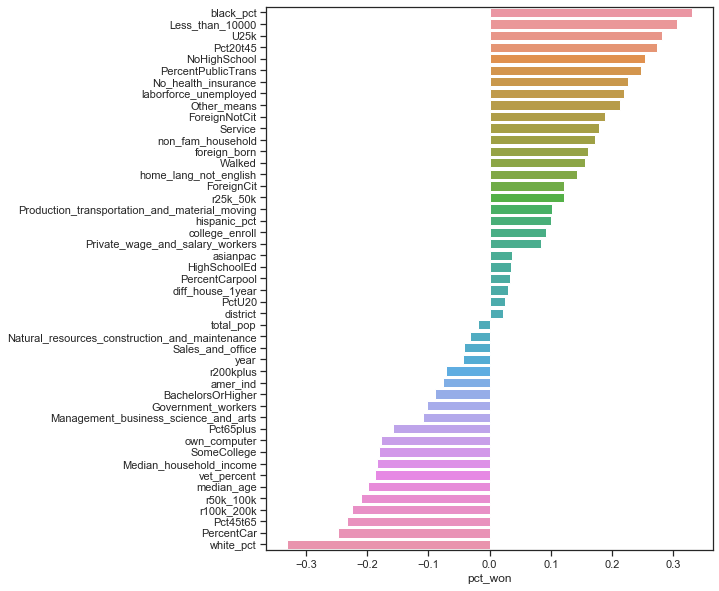

In [84]:
corr = cor.sort_values('pct_won', ascending=False)
plt.figure(figsize=(8,10))
sns.barplot( corr.pct_won[1:], corr.index[1:], orient='h')
plt.show()

In [107]:
def filter_df_corr(inp_data):
    
    if isinstance(inp_data, np.ndarray):
        inp_data = pd.DataFrame(data=inp_data)
        array_flag = True
    else:
        array_flag = False
    corr_matrix = inp_data.corr()

    # Iterates through Correlation Matrix Table to find correlated columns
    drop_cols = []
    n_cols = len(corr_matrix.columns)

    for i in range(n_cols):
        for k in range(i+1, n_cols):
            val = corr_matrix.iloc[k, i]
            col = corr_matrix.columns[i]
            row = corr_matrix.index[k]
            if abs(val) >= 0.7:
                # Prints the correlated feature set and the corr val
                print(col, "|", row, "|", round(val, 2))
                drop_cols.append(col)
                
filter_df_corr(data)

PercentCar | PercentPublicTrans | -0.96
PercentCar | Walked | -0.79
Management_business_science_and_arts | Natural_resources_construction_and_maintenance | -0.71
Management_business_science_and_arts | Production_transportation_and_material_moving | -0.73
Management_business_science_and_arts | Median_household_income | 0.78
Management_business_science_and_arts | r25k_50k | -0.8
Management_business_science_and_arts | r100k_200k | 0.73
Management_business_science_and_arts | r200kplus | 0.82
Management_business_science_and_arts | BachelorsOrHigher | 0.96
Natural_resources_construction_and_maintenance | BachelorsOrHigher | -0.71
Production_transportation_and_material_moving | BachelorsOrHigher | -0.74
Private_wage_and_salary_workers | Government_workers | -0.92
Less_than_10000 | Median_household_income | -0.74
Less_than_10000 | U25k | 0.93
Less_than_10000 | r100k_200k | -0.76
Median_household_income | own_computer | 0.72
Median_household_income | U25k | -0.88
Median_household_income | r25k_

### 2014

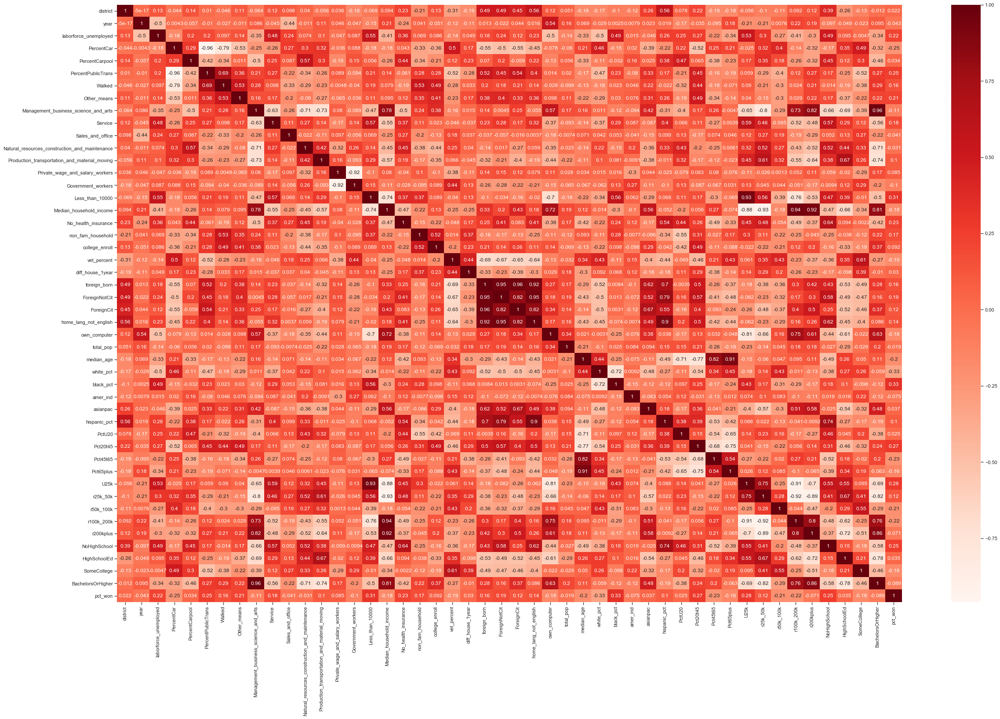

In [94]:
plt.figure(figsize=(40,25))
corr_2014 = Parties2014.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [96]:
cor_target = abs(corr_2014["pct_won"])
relevant_features = cor_target[cor_target>0.1].sort_values(ascending=False)
relevant_features

pct_won                                          1.000000
black_pct                                        0.330734
No_health_insurance                              0.302304
U25k                                             0.266868
Less_than_10000                                  0.252751
white_pct                                        0.250609
r100k_200k                                       0.229436
Median_household_income                          0.226943
Pct45t65                                         0.205980
NoHighSchool                                     0.203427
r50k_100k                                        0.200985
Pct20t45                                         0.200627
laborforce_unemployed                            0.188466
Government_workers                               0.184745
own_computer                                     0.178901
Private_wage_and_salary_workers                  0.166740
r25k_50k                                         0.159624
median_age    

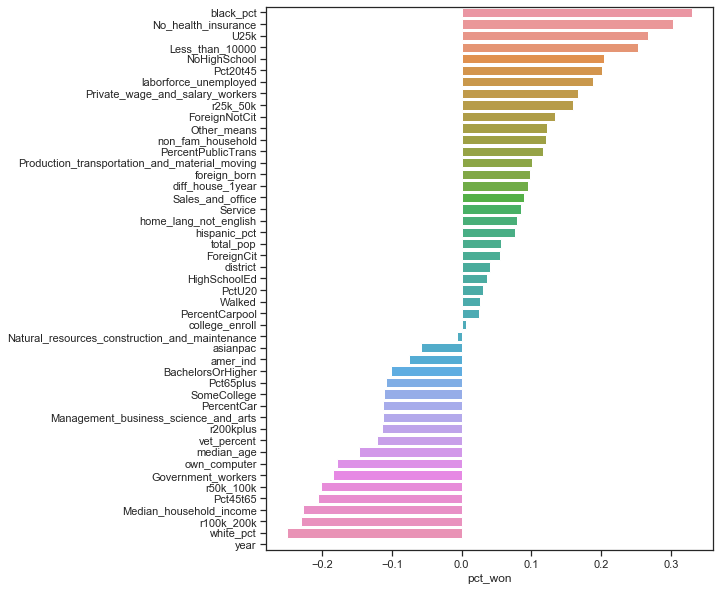

In [97]:
corr = corr_2014.sort_values('pct_won', ascending=False)
plt.figure(figsize=(8,10))
sns.barplot( corr.pct_won[1:], corr.index[1:], orient='h')
plt.show()

In [98]:
filter_df_corr(Parties2014)

PercentCar | PercentPublicTrans | -0.96
PercentCar | Walked | -0.8
Management_business_science_and_arts | Natural_resources_construction_and_maintenance | -0.7
Management_business_science_and_arts | Production_transportation_and_material_moving | -0.74
Management_business_science_and_arts | Median_household_income | 0.79
Management_business_science_and_arts | own_computer | 0.7
Management_business_science_and_arts | r25k_50k | -0.8
Management_business_science_and_arts | r100k_200k | 0.76
Management_business_science_and_arts | r200kplus | 0.83
Management_business_science_and_arts | BachelorsOrHigher | 0.96
Production_transportation_and_material_moving | BachelorsOrHigher | -0.75
Private_wage_and_salary_workers | Government_workers | -0.92
Less_than_10000 | Median_household_income | -0.77
Less_than_10000 | own_computer | -0.78
Less_than_10000 | U25k | 0.93
Less_than_10000 | r100k_200k | -0.76
Median_household_income | own_computer | 0.81
Median_household_income | U25k | -0.91
Median_hous

### 2014 Dem

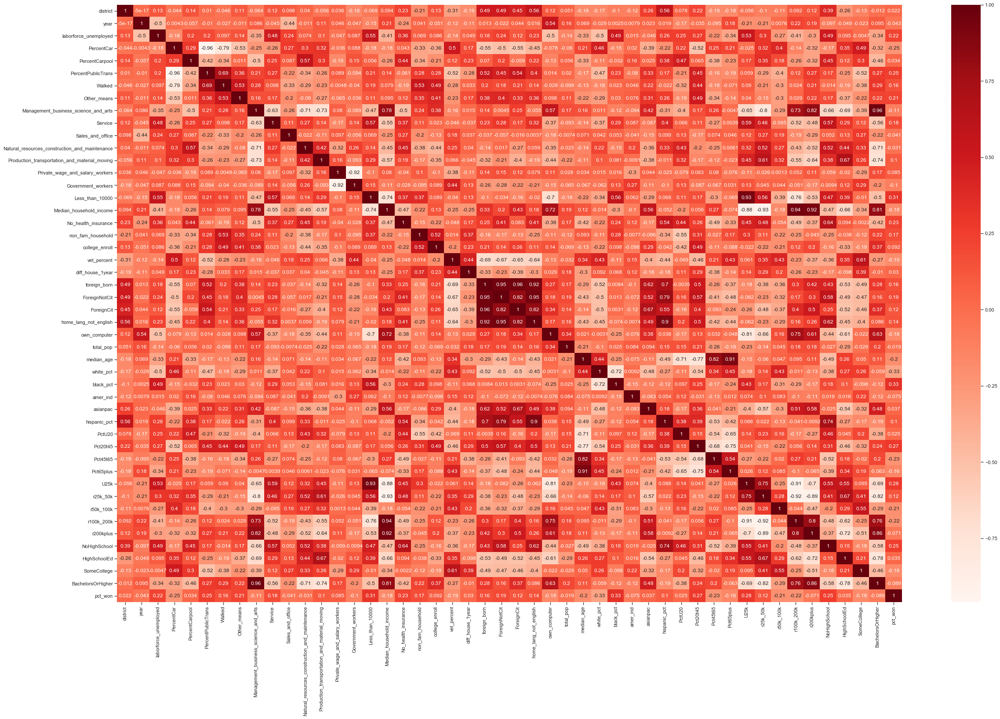

In [100]:
plt.figure(figsize=(40,25))
corr_Dem2014 = Dem2014.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [108]:
cor_target = abs(corr_Dem2014["pct_won"])
relevant_features = cor_target[cor_target>0.1].sort_values(ascending=False)
relevant_features

pct_won                                          1.000000
black_pct                                        0.526329
white_pct                                        0.488290
U25k                                             0.419425
Less_than_10000                                  0.414711
laborforce_unemployed                            0.410795
Pct20t45                                         0.363788
r100k_200k                                       0.347329
r50k_100k                                        0.344982
Median_household_income                          0.333115
No_health_insurance                              0.328227
Pct45t65                                         0.289783
median_age                                       0.288538
Pct65plus                                        0.286445
own_computer                                     0.277490
non_fam_household                                0.269122
Service                                          0.257251
NoHighSchool  

In [109]:
filter_df_corr(Dem2014)

PercentCar | PercentPublicTrans | -0.97
PercentCar | Walked | -0.81
PercentPublicTrans | Walked | 0.72
Management_business_science_and_arts | Service | -0.71
Management_business_science_and_arts | Natural_resources_construction_and_maintenance | -0.71
Management_business_science_and_arts | Production_transportation_and_material_moving | -0.79
Management_business_science_and_arts | Median_household_income | 0.77
Management_business_science_and_arts | r25k_50k | -0.82
Management_business_science_and_arts | r100k_200k | 0.75
Management_business_science_and_arts | r200kplus | 0.83
Management_business_science_and_arts | NoHighSchool | -0.74
Management_business_science_and_arts | BachelorsOrHigher | 0.97
Production_transportation_and_material_moving | BachelorsOrHigher | -0.79
Private_wage_and_salary_workers | Government_workers | -0.9
Less_than_10000 | Median_household_income | -0.77
Less_than_10000 | own_computer | -0.8
Less_than_10000 | U25k | 0.94
Less_than_10000 | r100k_200k | -0.78
Med

## Dem Correalation

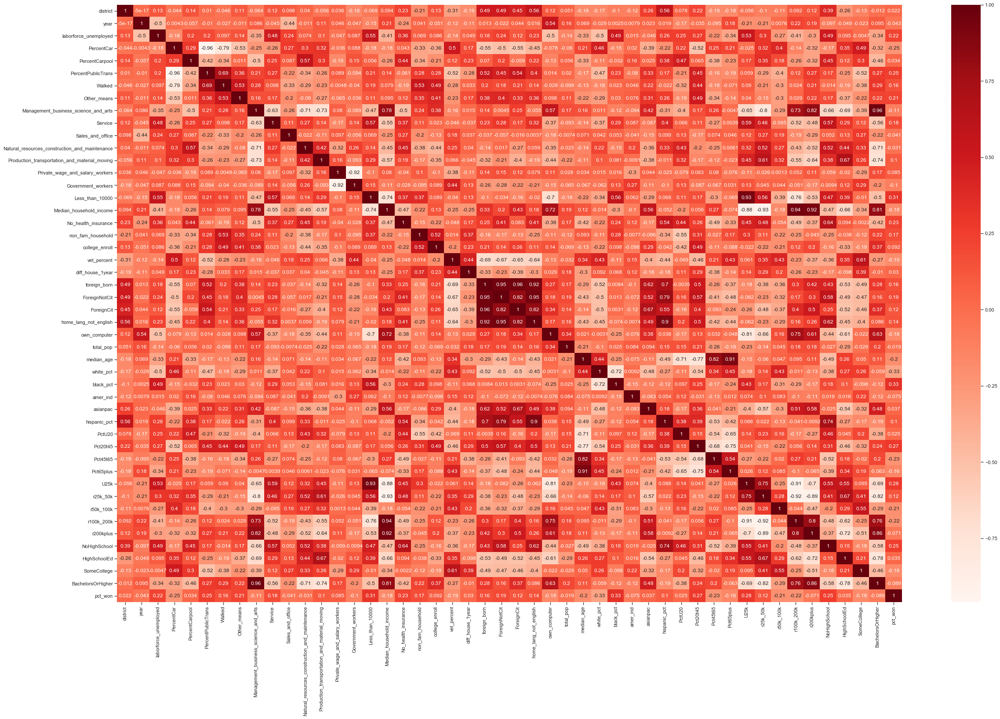

In [74]:
plt.figure(figsize=(40,25))
corr_dem = data3.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [75]:
cor_target = abs(corr_dem["pct_won"])
relevant_features = cor_target[cor_target>0.1].sort_values(ascending=False)
relevant_features

pct_won                                           1.000000
white_pct                                         0.518636
black_pct                                         0.455374
Pct20t45                                          0.408337
Less_than_10000                                   0.361824
PercentCar                                        0.347725
PercentPublicTrans                                0.329432
U25k                                              0.319072
vet_percent                                       0.317040
median_age                                        0.315704
Pct45t65                                          0.315056
Pct65plus                                         0.287481
Other_means                                       0.284955
laborforce_unemployed                             0.271947
r50k_100k                                         0.268240
non_fam_household                                 0.262567
Service                                           0.2593

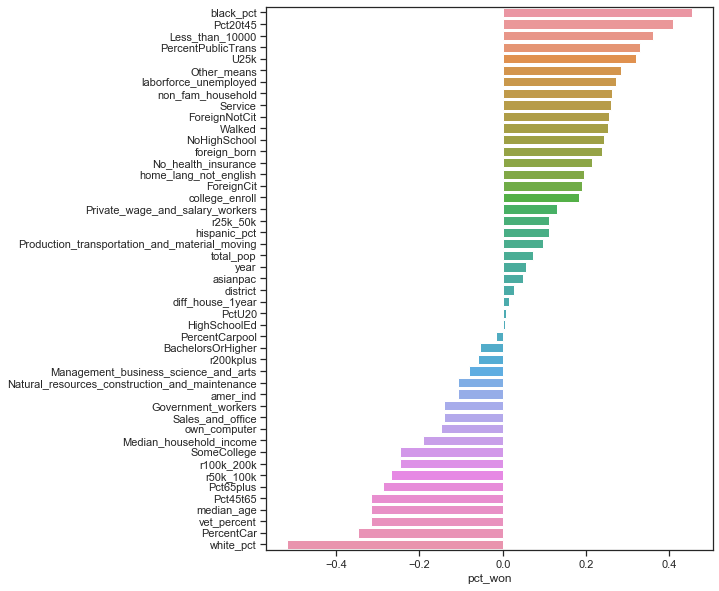

In [86]:
corr = corr_dem.sort_values('pct_won', ascending=False)
plt.figure(figsize=(8,10))
sns.barplot( corr.pct_won[1:], corr.index[1:], orient='h')
plt.show()

In [102]:
filter_df_corr(data3)

PercentCar | PercentPublicTrans | -0.97
PercentCar | Walked | -0.81
PercentPublicTrans | Walked | 0.71
Management_business_science_and_arts | Service | -0.73
Management_business_science_and_arts | Natural_resources_construction_and_maintenance | -0.71
Management_business_science_and_arts | Production_transportation_and_material_moving | -0.78
Management_business_science_and_arts | Median_household_income | 0.77
Management_business_science_and_arts | r25k_50k | -0.81
Management_business_science_and_arts | r100k_200k | 0.71
Management_business_science_and_arts | r200kplus | 0.81
Management_business_science_and_arts | NoHighSchool | -0.73
Management_business_science_and_arts | HighSchoolEd | -0.7
Management_business_science_and_arts | BachelorsOrHigher | 0.97
Production_transportation_and_material_moving | BachelorsOrHigher | -0.77
Private_wage_and_salary_workers | Government_workers | -0.9
Less_than_10000 | Median_household_income | -0.76
Less_than_10000 | own_computer | -0.73
Less_than_

## Republican Correalation

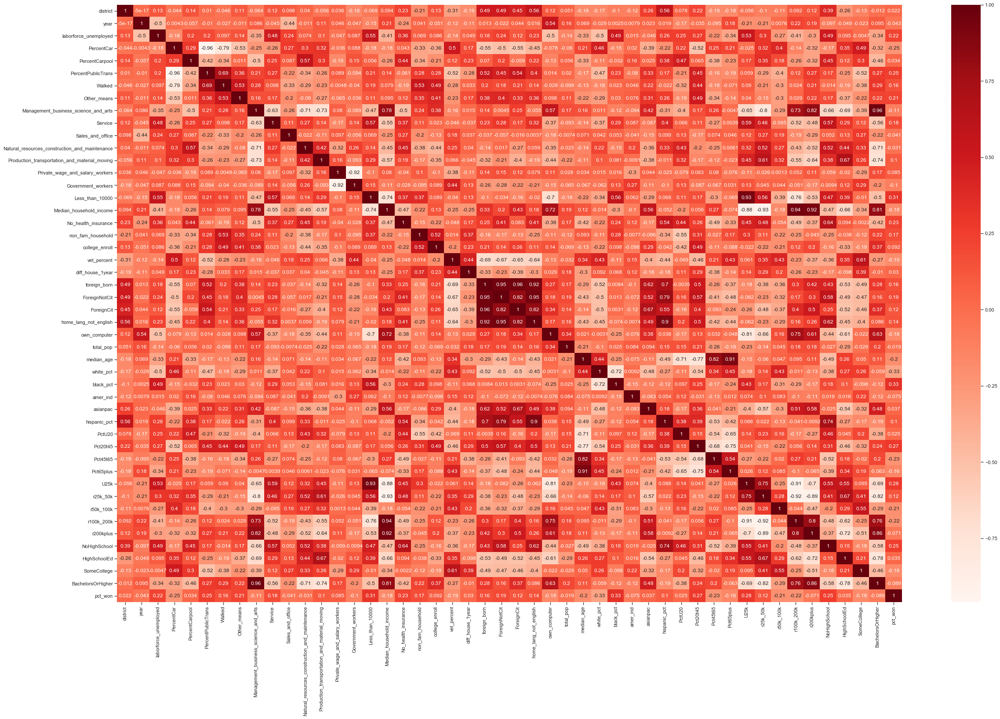

In [76]:
plt.figure(figsize=(40,25))
corr_rep = data4.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [77]:
cor_target = abs(corr_rep["pct_won"])
relevant_features = cor_target[cor_target>0.1].sort_values(ascending=False)
relevant_features

pct_won                                           1.000000
r100k_200k                                        0.255973
No_health_insurance                               0.255018
own_computer                                      0.252965
Median_household_income                           0.251459
U25k                                              0.241944
r25k_50k                                          0.241088
BachelorsOrHigher                                 0.233503
NoHighSchool                                      0.231524
Management_business_science_and_arts              0.218837
PercentCar                                        0.216616
r200kplus                                         0.205755
Less_than_10000                                   0.205408
Walked                                            0.188046
PercentPublicTrans                                0.187942
asianpac                                          0.180309
Production_transportation_and_material_moving     0.1794

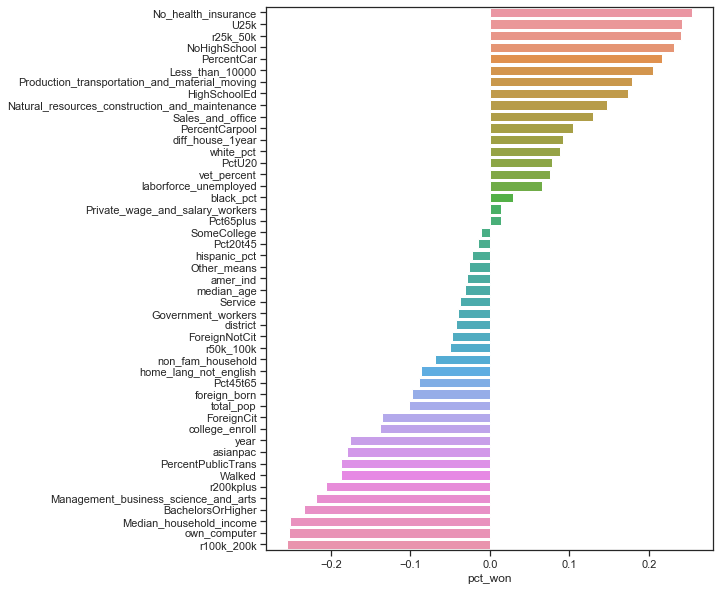

In [88]:
corr = corr_rep.sort_values('pct_won', ascending=False)
plt.figure(figsize=(8,10))
sns.barplot( corr.pct_won[1:], corr.index[1:], orient='h')
plt.show()

In [89]:
filter_df_corr(data3)

PercentCar | PercentPublicTrans | -0.97
PercentCar | Walked | -0.81
PercentPublicTrans | Walked | 0.71
Management_business_science_and_arts | Service | -0.73
Management_business_science_and_arts | Natural_resources_construction_and_maintenance | -0.71
Management_business_science_and_arts | Production_transportation_and_material_moving | -0.78
Management_business_science_and_arts | Median_household_income | 0.77
Management_business_science_and_arts | r25k_50k | -0.81
Management_business_science_and_arts | r100k_200k | 0.71
Management_business_science_and_arts | r200kplus | 0.81
Management_business_science_and_arts | NoHighSchool | -0.73
Management_business_science_and_arts | HighSchoolEd | -0.7
Management_business_science_and_arts | BachelorsOrHigher | 0.97
Production_transportation_and_material_moving | BachelorsOrHigher | -0.77
Private_wage_and_salary_workers | Government_workers | -0.9
Less_than_10000 | Median_household_income | -0.76
Less_than_10000 | own_computer | -0.73
Less_than_